In [46]:
# Аугментации
from torchvision.transforms.v2 import RandomRotation, RandomPhotometricDistort, \
RandomHorizontalFlip, RandomVerticalFlip, Compose, Resize
from torchvision.transforms import ToTensor, Normalize

# Загрузка датасета
from torchvision.datasets import ImageFolder
from torch.utils.data import Dataset, DataLoader
import torch
import kagglehub
import os
import shutil

# Модель
from torchsummary import summary
from torchvision.models import efficientnet_v2_s
import torch.nn as nn

# Обучение
import torch.optim as optim
from tqdm import tqdm
from torch.optim.lr_scheduler import ReduceLROnPlateau

# Валидация
from sklearn.metrics import classification_report

# Визуализация
from matplotlib import pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.metrics import confusion_matrix

In [2]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


**Веса модели:** https://disk.yandex.ru/d/N2lJk7u0hhFXSw

# 1. Загрузка и предобработка данных

## Установка датасета

Используемый датасет: https://www.kaggle.com/datasets/richardradli/ogyeiv2/data

In [5]:
# Установка последней версии
downloaded_path = kagglehub.dataset_download("richardradli/ogyeiv2")

In [6]:
dataset_path = os.path.join('data', 'raw', 'digikala')
dataset_path = os.path.join(os.getcwd(), dataset_path)

In [ ]:
# Перемещаем в dataset_path
if os.path.exists(dataset_path):
    shutil.rmtree(dataset_path)

shutil.move(downloaded_path, dataset_path)
print(f"Датасет сохранён в: {dataset_path}")

## Создание DataLoaders

In [7]:
source_path = os.path.join(dataset_path, 'ogyeiv', 'ogyeiv2', 'ogyeiv2')
target_path = os.path.join(dataset_path, '..', '..', 'processed', 'digikala')
os.makedirs(target_path, exist_ok=True)
print(f"Датасет будет сохранён по пути: {target_path}")

Датасет будет сохранён по пути: /home/evgeniy/Документы/GitHub/YandexNN/sprint_3/data/raw/digikala/../../processed/digikala


In [ ]:
# Приведение датасета к формату ImageFolder
folders = ["train", "valid", "test"]

for folder in folders:
    src_images = os.path.join(source_path, folder, "images")
    src_labels = os.path.join(source_path, folder, "labels")
    target_folder = os.path.join(target_path, folder)
    os.makedirs(target_folder, exist_ok=True)

    image_files = [
        f for f in os.listdir(src_images)
        if f.lower().endswith((".jpg", ".jpeg", ".png"))
    ]

    print(f"Processing {folder}: {len(image_files)} images")

    for img_name in tqdm(image_files):
        # Extract class name from filename
        # acc_long_600_mg_s_022.jpg -> acc_long_600_mg
        class_name = "_".join(img_name.split("_")[:-2])

        class_dir = os.path.join(target_folder, class_name)
        os.makedirs(class_dir, exist_ok=True)

        src_img_path = os.path.join(src_images, img_name)
        trg_img_path = os.path.join(class_dir, img_name)

        shutil.copy2(src_img_path, trg_img_path)

In [8]:
# Аугментации
train_transforms = Compose([
    Resize((384, 384)),  # Рекомендуется для efficientnet_v2_s
    ToTensor(),
    Normalize((0.5), (0.5)),
    RandomHorizontalFlip(p=0.2),
    RandomVerticalFlip(p=0.2),
    RandomRotation([-5, 5], fill=255.)
])

val_transforms = Compose([
    Resize((384, 384)),  # Рекомендуется для efficientnet_v2_s
    ToTensor(),
    Normalize((0.5), (0.5))
]) 

In [9]:
train_dataset = ImageFolder(os.path.join(target_path, 'train'), transform=train_transforms)
val_dataset = ImageFolder(os.path.join(target_path, 'valid'), transform=val_transforms)
test_dataset = ImageFolder(os.path.join(target_path, 'test'), transform=val_transforms)

In [10]:
batch_size = 64
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

In [11]:
print("Количество изображений в train:", len(train_dataset))
print("Количество изображений в val:", len(val_dataset))
print("Количество изображений в test:", len(test_dataset))
print("Список классов:", train_dataset.classes) 

Количество изображений в train: 3136
Количество изображений в val: 672
Количество изображений в test: 672
Список классов: ['acc_long_600_mg', 'advil_ultra_forte', 'akineton_2_mg', 'algoflex_forte_dolo_400_mg', 'algoflex_rapid_400_mg', 'algopyrin_500_mg', 'ambroxol_egis_30_mg', 'apranax_550_mg', 'aspirin_ultra_500_mg', 'atoris_20_mg', 'atorvastatin_teva_20_mg', 'betaloc_50_mg', 'bila_git', 'c_vitamin_teva_500_mg', 'calci_kid', 'cataflam_50_mg', 'cataflam_dolo_25_mg', 'cataflam_v_50_mg', 'cetirizin_10_mg', 'co_perineva_4_mg_1_25_mg', 'co_xeter_20_mg_10_mg', 'cold_fx', 'coldrex', 'concor_10_mg', 'concor_5_mg', 'condrosulf_800_mg', 'controloc_20_mg', 'covercard_plus_10_mg_2_5_mg_5_mg', 'coverex_4_mg', 'diclopram_75-mg_20-mg', 'donalgin_250_mg', 'dorithricin_mentol', 'doxazosin_hexal_4_mg', 'doxazosin_sandoz_uro_4_mg', 'dulodet_60_mg', 'dulsevia_60_mg', 'enterol_250_mg', 'escitil_10_mg', 'favipiravir_meditop_200_mg', 'frontin_0_25_mg', 'frontin_0_5_mg', 'furon_40_mg', 'ibumax_400_mg', 'inda

# 2. Объявление модели

In [11]:
# Загрузка модели
model = efficientnet_v2_s(weights='IMAGENET1K_V1')
print(model)

EfficientNet(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 24, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(24, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): FusedMBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(24, 24, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
            (1): BatchNorm2d(24, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
            (2): SiLU(inplace=True)
          )
        )
        (stochastic_depth): StochasticDepth(p=0.0, mode=row)
      )
      (1): FusedMBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(24, 24, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
            (1): BatchNorm2d(24, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  

In [12]:
# Изменение только классификатора (может, этого хватит)
for param in model.parameters():
    param.requires_grad = False

for param in model.classifier.parameters():
    param.requires_grad = True

model.classifier = nn.Linear(1280, len(train_dataset.classes), bias=True)
summary(model, input_size=(3, 384, 384), device='cpu')

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 24, 192, 192]             648
       BatchNorm2d-2         [-1, 24, 192, 192]              48
              SiLU-3         [-1, 24, 192, 192]               0
            Conv2d-4         [-1, 24, 192, 192]           5,184
       BatchNorm2d-5         [-1, 24, 192, 192]              48
              SiLU-6         [-1, 24, 192, 192]               0
   StochasticDepth-7         [-1, 24, 192, 192]               0
       FusedMBConv-8         [-1, 24, 192, 192]               0
            Conv2d-9         [-1, 24, 192, 192]           5,184
      BatchNorm2d-10         [-1, 24, 192, 192]              48
             SiLU-11         [-1, 24, 192, 192]               0
  StochasticDepth-12         [-1, 24, 192, 192]               0
      FusedMBConv-13         [-1, 24, 192, 192]               0
           Conv2d-14           [-1, 96,

In [13]:
model = model.to(device)

# 3. Обучение модели

In [14]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001) 

In [15]:
def train_one_epoch(epoch_index, train_model):
    total_loss = 0.0          # сумма потерь за всю эпоху
    running_loss = 0.0        # для скользящего среднего (20 батчей)
    correct = 0
    total = 0

    progress_bar = tqdm(enumerate(train_loader), 
                        total=len(train_loader),
                        desc=f'Эпоха {epoch_index}',
                        unit='batch')
    
    for batch_index, data in progress_bar:
        inputs, labels = data
        inputs = inputs.to(device)
        labels = labels.to(device)
        
        optimizer.zero_grad()
        outputs = train_model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        # -- накопление статистики --
        batch_loss = loss.item()
        total_loss += batch_loss
        running_loss += batch_loss

        # точность: предсказанный класс = argmax
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

        # -- прогресс-бар: средний loss за последние 20 батчей --
        if batch_index % 5 == 4:
            last_loss = running_loss / 5.0
            progress_bar.set_postfix({'loss': f'{last_loss:.4f}'})
            running_loss = 0.0

    # средние показатели за всю эпоху
    avg_loss = total_loss / len(train_loader)
    avg_acc = correct / total
    return avg_loss, avg_acc

In [17]:
EPOCHS = 30
best_vloss = 1e5

train_losses = []
train_accuracies = []
val_losses = []
val_accuracies = []

for epoch in range(EPOCHS):
    # --- Обучение ---
    avg_loss, avg_acc = train_one_epoch(epoch, model)
    train_losses.append(avg_loss)
    train_accuracies.append(avg_acc)
    
    # --- Валидация ---
    model.eval()
    running_vloss = 0.0
    correct = 0
    total = 0
    with torch.no_grad():
        for i, vdata in enumerate(val_loader):
            vinputs, vlabels = vdata
            vinputs = vinputs.to(device)
            vlabels = vlabels.to(device)
            
            voutputs = model(vinputs)
            vloss = criterion(voutputs, vlabels)
            running_vloss += vloss.item()
            
            # --- Подсчёт accuracy ---
            _, predicted = torch.max(voutputs.data, 1)
            total += vlabels.size(0)
            correct += (predicted == vlabels).sum().item()
    
    avg_vloss = running_vloss / (i + 1)
    val_losses.append(avg_vloss)
    
    val_acc = correct / total
    val_accuracies.append(val_acc)

    # --- Сохранение лучшей модели по loss ---
    if avg_vloss < best_vloss:
        best_vloss = avg_vloss
        model_path = f'models/pills_classifier/pills_classifier_{epoch}.pt'
        torch.save(model.state_dict(), model_path)

    # --- Вывод метрик ---
    print(f'Train loss: {avg_loss:.4f}, Train acc: {avg_acc:.4f}')
    print(f'Val loss:   {avg_vloss:.4f}, Val acc:   {val_acc:.4f}\n')

Эпоха 0: 100%|█████████████████████████| 49/49 [02:28<00:00,  3.02s/batch, loss=4.6713]


Train loss: 4.7016, Train acc: 0.0220
Val loss:   4.5962, Val acc:   0.0685



Эпоха 1: 100%|█████████████████████████| 49/49 [02:29<00:00,  3.05s/batch, loss=4.4919]


Train loss: 4.5358, Train acc: 0.0762
Val loss:   4.4268, Val acc:   0.1027



Эпоха 2: 100%|█████████████████████████| 49/49 [02:24<00:00,  2.94s/batch, loss=4.3343]


Train loss: 4.3638, Train acc: 0.1368
Val loss:   4.2712, Val acc:   0.1324



Эпоха 3: 100%|█████████████████████████| 49/49 [02:23<00:00,  2.93s/batch, loss=4.1900]


Train loss: 4.2022, Train acc: 0.1795
Val loss:   4.1239, Val acc:   0.1548



Эпоха 4: 100%|█████████████████████████| 49/49 [02:31<00:00,  3.09s/batch, loss=4.0109]


Train loss: 4.0500, Train acc: 0.2254
Val loss:   3.9962, Val acc:   0.1682



Эпоха 5: 100%|█████████████████████████| 49/49 [02:31<00:00,  3.09s/batch, loss=3.9113]


Train loss: 3.9214, Train acc: 0.2481
Val loss:   3.8753, Val acc:   0.1875



Эпоха 6: 100%|█████████████████████████| 49/49 [02:31<00:00,  3.09s/batch, loss=3.7105]


Train loss: 3.7902, Train acc: 0.2682
Val loss:   3.7788, Val acc:   0.2039



Эпоха 7: 100%|█████████████████████████| 49/49 [02:23<00:00,  2.94s/batch, loss=3.6815]


Train loss: 3.6763, Train acc: 0.2982
Val loss:   3.6701, Val acc:   0.2411



Эпоха 8: 100%|█████████████████████████| 49/49 [02:22<00:00,  2.91s/batch, loss=3.5326]


Train loss: 3.5712, Train acc: 0.3147
Val loss:   3.5768, Val acc:   0.2500



Эпоха 9: 100%|█████████████████████████| 49/49 [02:26<00:00,  2.99s/batch, loss=3.5075]


Train loss: 3.4863, Train acc: 0.3326
Val loss:   3.4893, Val acc:   0.2649



Эпоха 10: 100%|████████████████████████| 49/49 [02:21<00:00,  2.90s/batch, loss=3.2821]


Train loss: 3.3969, Train acc: 0.3540
Val loss:   3.4267, Val acc:   0.2723



Эпоха 11: 100%|████████████████████████| 49/49 [02:21<00:00,  2.89s/batch, loss=3.2911]


Train loss: 3.3039, Train acc: 0.3696
Val loss:   3.3538, Val acc:   0.2857



Эпоха 12: 100%|████████████████████████| 49/49 [02:21<00:00,  2.90s/batch, loss=3.1623]


Train loss: 3.2326, Train acc: 0.3884
Val loss:   3.2964, Val acc:   0.2961



Эпоха 13: 100%|████████████████████████| 49/49 [02:21<00:00,  2.89s/batch, loss=3.1620]


Train loss: 3.1465, Train acc: 0.4002
Val loss:   3.2379, Val acc:   0.3080



Эпоха 14: 100%|████████████████████████| 49/49 [02:21<00:00,  2.89s/batch, loss=2.9888]


Train loss: 3.0829, Train acc: 0.4149
Val loss:   3.1908, Val acc:   0.3229



Эпоха 15: 100%|████████████████████████| 49/49 [02:21<00:00,  2.88s/batch, loss=2.9884]


Train loss: 3.0300, Train acc: 0.4228
Val loss:   3.1462, Val acc:   0.3274



Эпоха 16: 100%|████████████████████████| 49/49 [02:20<00:00,  2.87s/batch, loss=2.9682]


Train loss: 2.9648, Train acc: 0.4327
Val loss:   3.1043, Val acc:   0.3423



Эпоха 17: 100%|████████████████████████| 49/49 [02:23<00:00,  2.94s/batch, loss=2.9135]


Train loss: 2.9232, Train acc: 0.4493
Val loss:   3.0611, Val acc:   0.3393



Эпоха 18: 100%|████████████████████████| 49/49 [02:23<00:00,  2.93s/batch, loss=2.8902]


Train loss: 2.8538, Train acc: 0.4678
Val loss:   3.0222, Val acc:   0.3378



Эпоха 19: 100%|████████████████████████| 49/49 [02:23<00:00,  2.94s/batch, loss=2.7676]


Train loss: 2.8067, Train acc: 0.4681
Val loss:   2.9842, Val acc:   0.3423



Эпоха 20: 100%|████████████████████████| 49/49 [02:25<00:00,  2.97s/batch, loss=2.7395]


Train loss: 2.7658, Train acc: 0.4710
Val loss:   2.9528, Val acc:   0.3423



Эпоха 21: 100%|████████████████████████| 49/49 [02:24<00:00,  2.94s/batch, loss=2.7645]


Train loss: 2.7061, Train acc: 0.4812
Val loss:   2.9209, Val acc:   0.3542



Эпоха 22: 100%|████████████████████████| 49/49 [02:23<00:00,  2.92s/batch, loss=2.6825]


Train loss: 2.6722, Train acc: 0.4837
Val loss:   2.8819, Val acc:   0.3631



Эпоха 23: 100%|████████████████████████| 49/49 [02:21<00:00,  2.89s/batch, loss=2.5944]


Train loss: 2.6301, Train acc: 0.5000
Val loss:   2.8408, Val acc:   0.3780



Эпоха 24: 100%|████████████████████████| 49/49 [02:22<00:00,  2.92s/batch, loss=2.4627]


Train loss: 2.5988, Train acc: 0.5054
Val loss:   2.8108, Val acc:   0.3765



Эпоха 25: 100%|████████████████████████| 49/49 [02:23<00:00,  2.94s/batch, loss=2.6922]


Train loss: 2.5590, Train acc: 0.5086
Val loss:   2.7755, Val acc:   0.3884



Эпоха 26: 100%|████████████████████████| 49/49 [02:21<00:00,  2.90s/batch, loss=2.6400]


Train loss: 2.5113, Train acc: 0.5172
Val loss:   2.7467, Val acc:   0.3765



Эпоха 27: 100%|████████████████████████| 49/49 [02:21<00:00,  2.89s/batch, loss=2.4240]


Train loss: 2.4738, Train acc: 0.5220
Val loss:   2.7107, Val acc:   0.4062



Эпоха 28: 100%|████████████████████████| 49/49 [02:24<00:00,  2.94s/batch, loss=2.4616]


Train loss: 2.4459, Train acc: 0.5271
Val loss:   2.6872, Val acc:   0.3884



Эпоха 29: 100%|████████████████████████| 49/49 [02:24<00:00,  2.95s/batch, loss=2.4381]


Train loss: 2.4018, Train acc: 0.5364
Val loss:   2.6800, Val acc:   0.4033



## Графики обучения

In [18]:
save_dir = os.path.join(os.getcwd(),'docs', 'digikala')
os.makedirs(save_dir, exist_ok=True)

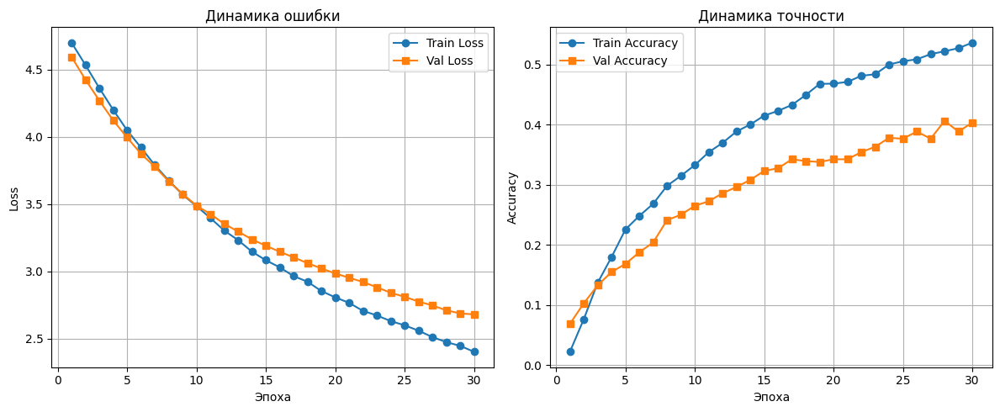

In [19]:
plt.figure(figsize=(12, 5))

# --- График ошибок (loss) ---
plt.subplot(1, 2, 1)
plt.plot(range(1, EPOCHS+1), train_losses, label='Train Loss', marker='o')
plt.plot(range(1, EPOCHS+1), val_losses, label='Val Loss', marker='s')
plt.xlabel('Эпоха')
plt.ylabel('Loss')
plt.title('Динамика ошибки')
plt.legend()
plt.grid(True)

# --- График точности (accuracy) ---
plt.subplot(1, 2, 2)
plt.plot(range(1, EPOCHS+1), train_accuracies, label='Train Accuracy', marker='o')
plt.plot(range(1, EPOCHS+1), val_accuracies, label='Val Accuracy', marker='s')
plt.xlabel('Эпоха')
plt.ylabel('Accuracy')
plt.title('Динамика точности')
plt.legend()
plt.grid(True)

plt.tight_layout()

# Сохраняем в файл
plt.savefig(os.path.join(save_dir, 'training_history.png'), dpi=150)
plt.show()

# 4. Оценка качества

In [20]:
labels_predicted = []
labels_true = []

model.eval()

with torch.no_grad():
    for data in test_loader:
        images, labels = data
        images = images.to(device)
        labels = labels.to(device)

        outputs = model(images)
        # argmax по всем примерам, так как torch.max возвращает два параметра
        # максимальные значения в выборке и позиции, на которых они находятся (argmax)
        _, predicted = torch.max(outputs, 1) # argmax по всем примерам
        labels_predicted.extend(predicted.cpu().numpy())
        labels_true.extend(labels.cpu().numpy()) 

In [22]:
print(classification_report(labels_true, labels_predicted, target_names=train_dataset.classes)) 

                                  precision    recall  f1-score   support

                 acc_long_600_mg       1.00      0.67      0.80         6
               advil_ultra_forte       0.25      0.67      0.36         6
                   akineton_2_mg       0.50      0.17      0.25         6
      algoflex_forte_dolo_400_mg       0.86      1.00      0.92         6
           algoflex_rapid_400_mg       0.67      0.67      0.67         6
                algopyrin_500_mg       0.50      0.33      0.40         6
             ambroxol_egis_30_mg       1.00      0.17      0.29         6
                  apranax_550_mg       1.00      0.67      0.80         6
            aspirin_ultra_500_mg       0.00      0.00      0.00         6
                    atoris_20_mg       0.14      0.33      0.20         6
         atorvastatin_teva_20_mg       0.17      0.33      0.22         6
                   betaloc_50_mg       0.00      0.00      0.00         6
                        bila_git     

/home/evgeniy/Документы/GitHub/YandexNN/venv/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/evgeniy/Документы/GitHub/YandexNN/venv/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/evgeniy/Документы/GitHub/YandexNN/venv/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average,

**ВЫВОД:** Качество модели недостаточное. Сделаем её сложнее.

# 2.2. Загрузка модели

In [12]:
# Загрузка модели
model = efficientnet_v2_s(weights=None)
model.classifier = nn.Linear(1280, len(train_dataset.classes), bias=True)

In [13]:
state_dict = torch.load(f'models/pills_classifier/pills_classifier_{29}.pt')
model.load_state_dict(state_dict)
print(model)

EfficientNet(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 24, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(24, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): FusedMBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(24, 24, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
            (1): BatchNorm2d(24, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
            (2): SiLU(inplace=True)
          )
        )
        (stochastic_depth): StochasticDepth(p=0.0, mode=row)
      )
      (1): FusedMBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(24, 24, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
            (1): BatchNorm2d(24, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  

In [14]:
for param in model.parameters():
    param.requires_grad = False

for param in model.classifier.parameters():
    param.requires_grad = True

for param in model.features[7].parameters():
    param.requires_grad = True

for param in model.features[6].parameters():
    param.requires_grad = True

model.classifier = nn.Linear(1280, len(train_dataset.classes), bias=True)
summary(model, input_size=(3, 384, 384), device='cpu')

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 24, 192, 192]             648
       BatchNorm2d-2         [-1, 24, 192, 192]              48
              SiLU-3         [-1, 24, 192, 192]               0
            Conv2d-4         [-1, 24, 192, 192]           5,184
       BatchNorm2d-5         [-1, 24, 192, 192]              48
              SiLU-6         [-1, 24, 192, 192]               0
   StochasticDepth-7         [-1, 24, 192, 192]               0
       FusedMBConv-8         [-1, 24, 192, 192]               0
            Conv2d-9         [-1, 24, 192, 192]           5,184
      BatchNorm2d-10         [-1, 24, 192, 192]              48
             SiLU-11         [-1, 24, 192, 192]               0
  StochasticDepth-12         [-1, 24, 192, 192]               0
      FusedMBConv-13         [-1, 24, 192, 192]               0
           Conv2d-14           [-1, 96,

In [15]:
model = model.to(device)

# 3.2. Обучение новой модели

In [19]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=3e-4)
# При первом запуске этого обучения модель быстро потеряла точность до нуля и похоже застряла в локальном минимуме
# Было решено увеличить lr поскольку дообучение уже более агрессивное и выбран scheduler для борьбы с плато и локальными экстремумами
scheduler = ReduceLROnPlateau(
    optimizer,
    mode="min",
    factor=0.1,
    patience=3
)

In [21]:
def train_one_epoch(epoch_index, train_model):
    total_loss = 0.0          # сумма потерь за всю эпоху
    running_loss = 0.0        # для скользящего среднего (20 батчей)
    correct = 0
    total = 0

    progress_bar = tqdm(enumerate(train_loader), 
                        total=len(train_loader),
                        desc=f'Эпоха {epoch_index}',
                        unit='batch')
    
    for batch_index, data in progress_bar:
        inputs, labels = data
        inputs = inputs.to(device)
        labels = labels.to(device)
        
        optimizer.zero_grad()
        outputs = train_model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        # -- накопление статистики --
        batch_loss = loss.item()
        total_loss += batch_loss
        running_loss += batch_loss

        # точность: предсказанный класс = argmax
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

        # -- прогресс-бар: средний loss за последние 20 батчей --
        if batch_index % 5 == 4:
            last_loss = running_loss / 5.0
            progress_bar.set_postfix({'loss': f'{last_loss:.4f}'})
            running_loss = 0.0

    # средние показатели за всю эпоху
    avg_loss = total_loss / len(train_loader)
    avg_acc = correct / total
    return avg_loss, avg_acc

In [23]:
EPOCHS = 30
best_vloss = 1e5

train_losses = []
train_accuracies = []
val_losses = []
val_accuracies = []

for epoch in range(EPOCHS):
    # --- Обучение ---
    avg_loss, avg_acc = train_one_epoch(epoch, model)
    train_losses.append(avg_loss)
    train_accuracies.append(avg_acc)
    
    # --- Валидация ---
    model.eval()
    running_vloss = 0.0
    correct = 0
    total = 0
    with torch.no_grad():
        for i, vdata in enumerate(val_loader):
            vinputs, vlabels = vdata
            vinputs = vinputs.to(device)
            vlabels = vlabels.to(device)
            
            voutputs = model(vinputs)
            vloss = criterion(voutputs, vlabels)
            running_vloss += vloss.item()
            
            # --- Подсчёт accuracy ---
            _, predicted = torch.max(voutputs.data, 1)
            total += vlabels.size(0)
            correct += (predicted == vlabels).sum().item()
    
    avg_vloss = running_vloss / (i + 1)
    scheduler.step(avg_vloss)
    val_losses.append(avg_vloss)
    
    val_acc = correct / total
    val_accuracies.append(val_acc)

    # --- Сохранение лучшей модели по loss ---
    if avg_vloss < best_vloss:
        best_vloss = avg_vloss
        model_path = f'models/pills_classifier_advanced/pills_classifier_advanced_{epoch}.pt'
        torch.save(model.state_dict(), model_path)

    # --- Вывод метрик ---
    print(f'Train loss: {avg_loss:.4f}, Train acc: {avg_acc:.4f}')
    print(f'Val loss:   {avg_vloss:.4f}, Val acc:   {val_acc:.4f}\n')

Эпоха 0: 100%|███████████████████████| 49/49 [02:34<00:00,  3.15s/batch, loss=1.8227]


Train loss: 2.3626, Train acc: 0.3409
Val loss:   1.8952, Val acc:   0.4167



Эпоха 1: 100%|███████████████████████| 49/49 [02:35<00:00,  3.17s/batch, loss=1.5252]


Train loss: 1.5558, Train acc: 0.5115
Val loss:   1.3527, Val acc:   0.5372



Эпоха 2: 100%|███████████████████████| 49/49 [02:36<00:00,  3.20s/batch, loss=1.1000]


Train loss: 1.1589, Train acc: 0.6256
Val loss:   1.0102, Val acc:   0.6607



Эпоха 3: 100%|███████████████████████| 49/49 [02:28<00:00,  3.03s/batch, loss=0.8065]


Train loss: 0.9816, Train acc: 0.6853
Val loss:   1.1984, Val acc:   0.6071



Эпоха 4: 100%|███████████████████████| 49/49 [02:31<00:00,  3.08s/batch, loss=0.7467]


Train loss: 0.7246, Train acc: 0.7420
Val loss:   0.8222, Val acc:   0.7232



Эпоха 5: 100%|███████████████████████| 49/49 [02:35<00:00,  3.18s/batch, loss=0.6889]


Train loss: 0.6179, Train acc: 0.7966
Val loss:   0.8357, Val acc:   0.7396



Эпоха 6: 100%|███████████████████████| 49/49 [02:30<00:00,  3.06s/batch, loss=0.4331]


Train loss: 0.4863, Train acc: 0.8390
Val loss:   0.6054, Val acc:   0.7798



Эпоха 7: 100%|███████████████████████| 49/49 [02:29<00:00,  3.04s/batch, loss=0.5424]


Train loss: 0.5063, Train acc: 0.8310
Val loss:   0.7053, Val acc:   0.7500



Эпоха 8: 100%|███████████████████████| 49/49 [02:33<00:00,  3.13s/batch, loss=0.4122]


Train loss: 0.4159, Train acc: 0.8581
Val loss:   0.6363, Val acc:   0.7753



Эпоха 9: 100%|███████████████████████| 49/49 [02:27<00:00,  3.01s/batch, loss=0.3111]


Train loss: 0.3836, Train acc: 0.8715
Val loss:   0.5194, Val acc:   0.8318



Эпоха 10: 100%|██████████████████████| 49/49 [02:33<00:00,  3.14s/batch, loss=0.3362]


Train loss: 0.3028, Train acc: 0.8989
Val loss:   0.6112, Val acc:   0.8155



Эпоха 11: 100%|██████████████████████| 49/49 [02:34<00:00,  3.15s/batch, loss=0.3119]


Train loss: 0.2708, Train acc: 0.9098
Val loss:   0.4892, Val acc:   0.8467



Эпоха 12: 100%|██████████████████████| 49/49 [02:34<00:00,  3.16s/batch, loss=0.2137]


Train loss: 0.2328, Train acc: 0.9241
Val loss:   0.4506, Val acc:   0.8571



Эпоха 13: 100%|██████████████████████| 49/49 [02:32<00:00,  3.11s/batch, loss=0.1449]


Train loss: 0.1788, Train acc: 0.9391
Val loss:   0.4172, Val acc:   0.8646



Эпоха 14: 100%|██████████████████████| 49/49 [02:39<00:00,  3.25s/batch, loss=0.2076]


Train loss: 0.1863, Train acc: 0.9369
Val loss:   0.4706, Val acc:   0.8497



Эпоха 15: 100%|██████████████████████| 49/49 [02:37<00:00,  3.22s/batch, loss=0.2098]


Train loss: 0.1939, Train acc: 0.9369
Val loss:   0.5657, Val acc:   0.8155



Эпоха 16: 100%|██████████████████████| 49/49 [02:36<00:00,  3.19s/batch, loss=0.3179]


Train loss: 0.2549, Train acc: 0.9232
Val loss:   0.5752, Val acc:   0.8318



Эпоха 17: 100%|██████████████████████| 49/49 [02:33<00:00,  3.13s/batch, loss=0.2442]


Train loss: 0.1980, Train acc: 0.9276
Val loss:   0.4207, Val acc:   0.8720



Эпоха 18: 100%|██████████████████████| 49/49 [02:37<00:00,  3.21s/batch, loss=0.0713]


Train loss: 0.0762, Train acc: 0.9783
Val loss:   0.2699, Val acc:   0.9196



Эпоха 19: 100%|██████████████████████| 49/49 [02:35<00:00,  3.17s/batch, loss=0.0424]


Train loss: 0.0376, Train acc: 0.9904
Val loss:   0.2573, Val acc:   0.9226



Эпоха 20: 100%|██████████████████████| 49/49 [02:37<00:00,  3.21s/batch, loss=0.0348]


Train loss: 0.0301, Train acc: 0.9927
Val loss:   0.2468, Val acc:   0.9271



Эпоха 21: 100%|██████████████████████| 49/49 [02:37<00:00,  3.21s/batch, loss=0.0103]


Train loss: 0.0208, Train acc: 0.9962
Val loss:   0.2461, Val acc:   0.9286



Эпоха 22: 100%|██████████████████████| 49/49 [02:38<00:00,  3.24s/batch, loss=0.0187]


Train loss: 0.0206, Train acc: 0.9943
Val loss:   0.2405, Val acc:   0.9301



Эпоха 23: 100%|██████████████████████| 49/49 [02:37<00:00,  3.21s/batch, loss=0.0418]


Train loss: 0.0177, Train acc: 0.9965
Val loss:   0.2568, Val acc:   0.9211



Эпоха 24: 100%|██████████████████████| 49/49 [02:35<00:00,  3.17s/batch, loss=0.0124]


Train loss: 0.0184, Train acc: 0.9949
Val loss:   0.2512, Val acc:   0.9286



Эпоха 25: 100%|██████████████████████| 49/49 [02:34<00:00,  3.16s/batch, loss=0.0096]


Train loss: 0.0084, Train acc: 0.9994
Val loss:   0.2490, Val acc:   0.9271



Эпоха 26: 100%|██████████████████████| 49/49 [02:34<00:00,  3.16s/batch, loss=0.0062]


Train loss: 0.0119, Train acc: 0.9971
Val loss:   0.2518, Val acc:   0.9241



Эпоха 27: 100%|██████████████████████| 49/49 [02:35<00:00,  3.16s/batch, loss=0.0091]


Train loss: 0.0087, Train acc: 0.9994
Val loss:   0.2509, Val acc:   0.9256



Эпоха 28: 100%|██████████████████████| 49/49 [02:37<00:00,  3.20s/batch, loss=0.0202]


Train loss: 0.0137, Train acc: 0.9981
Val loss:   0.2480, Val acc:   0.9241



Эпоха 29: 100%|██████████████████████| 49/49 [02:38<00:00,  3.23s/batch, loss=0.0081]


Train loss: 0.0084, Train acc: 0.9984
Val loss:   0.2477, Val acc:   0.9241



## Графики обучения

In [25]:
save_dir = os.path.join(os.getcwd(),'docs', 'digikala')
os.makedirs(save_dir, exist_ok=True)

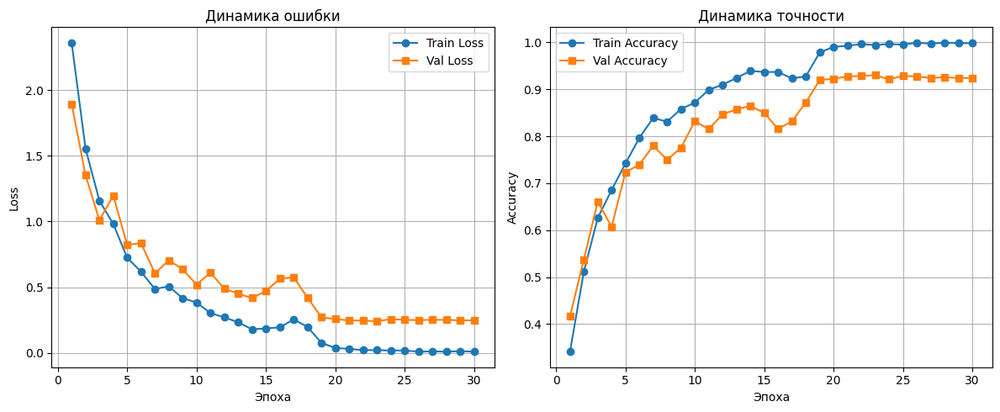

In [26]:
plt.figure(figsize=(12, 5))

# --- График ошибок (loss) ---
plt.subplot(1, 2, 1)
plt.plot(range(1, EPOCHS+1), train_losses, label='Train Loss', marker='o')
plt.plot(range(1, EPOCHS+1), val_losses, label='Val Loss', marker='s')
plt.xlabel('Эпоха')
plt.ylabel('Loss')
plt.title('Динамика ошибки')
plt.legend()
plt.grid(True)

# --- График точности (accuracy) ---
plt.subplot(1, 2, 2)
plt.plot(range(1, EPOCHS+1), train_accuracies, label='Train Accuracy', marker='o')
plt.plot(range(1, EPOCHS+1), val_accuracies, label='Val Accuracy', marker='s')
plt.xlabel('Эпоха')
plt.ylabel('Accuracy')
plt.title('Динамика точности')
plt.legend()
plt.grid(True)

plt.tight_layout()

# Сохраняем в файл
plt.savefig(os.path.join(save_dir, 'training_history_advanced.png'), dpi=150)
plt.show()

# 4.2.Оценка качества

In [27]:
labels_predicted = []
labels_true = []

model.eval()

with torch.no_grad():
    for data in test_loader:
        images, labels = data
        images = images.to(device)
        labels = labels.to(device)

        outputs = model(images)
        # argmax по всем примерам, так как torch.max возвращает два параметра
        # максимальные значения в выборке и позиции, на которых они находятся (argmax)
        _, predicted = torch.max(outputs, 1) # argmax по всем примерам
        labels_predicted.extend(predicted.cpu().numpy())
        labels_true.extend(labels.cpu().numpy()) 

In [28]:
print(classification_report(labels_true, labels_predicted, target_names=train_dataset.classes)) 

                                  precision    recall  f1-score   support

                 acc_long_600_mg       1.00      1.00      1.00         6
               advil_ultra_forte       1.00      1.00      1.00         6
                   akineton_2_mg       0.83      0.83      0.83         6
      algoflex_forte_dolo_400_mg       1.00      1.00      1.00         6
           algoflex_rapid_400_mg       1.00      1.00      1.00         6
                algopyrin_500_mg       1.00      1.00      1.00         6
             ambroxol_egis_30_mg       0.83      0.83      0.83         6
                  apranax_550_mg       1.00      1.00      1.00         6
            aspirin_ultra_500_mg       0.80      0.67      0.73         6
                    atoris_20_mg       1.00      1.00      1.00         6
         atorvastatin_teva_20_mg       0.62      0.83      0.71         6
                   betaloc_50_mg       0.86      1.00      0.92         6
                        bila_git     

# 5. Анализ результатов

**На каких 5 классах модель ошибается чаще всего?**
- teva_ambrobene_30_mg (recall=0.50, ошибок 3)
- cold_fx (recall=0.50, ошибок 3)
- frontin_0_25_mg (recall=0.50, ошибок 3)
- cataflam_v_50_mg (recall=0.50, ошибок 3)
- aspirin_ultra_500_mg (recall=0.67, ошибок 2)
- xeter_20_mg (recall=0.67, ошибок 2)
- meridian (recall=0.67, ошибок 2)
- verospiron_25_mg (recall=0.67, ошибок 2)
- neo_ferro_folgamma_114_mg_0_8_mg (recall=0.67, ошибок 2)

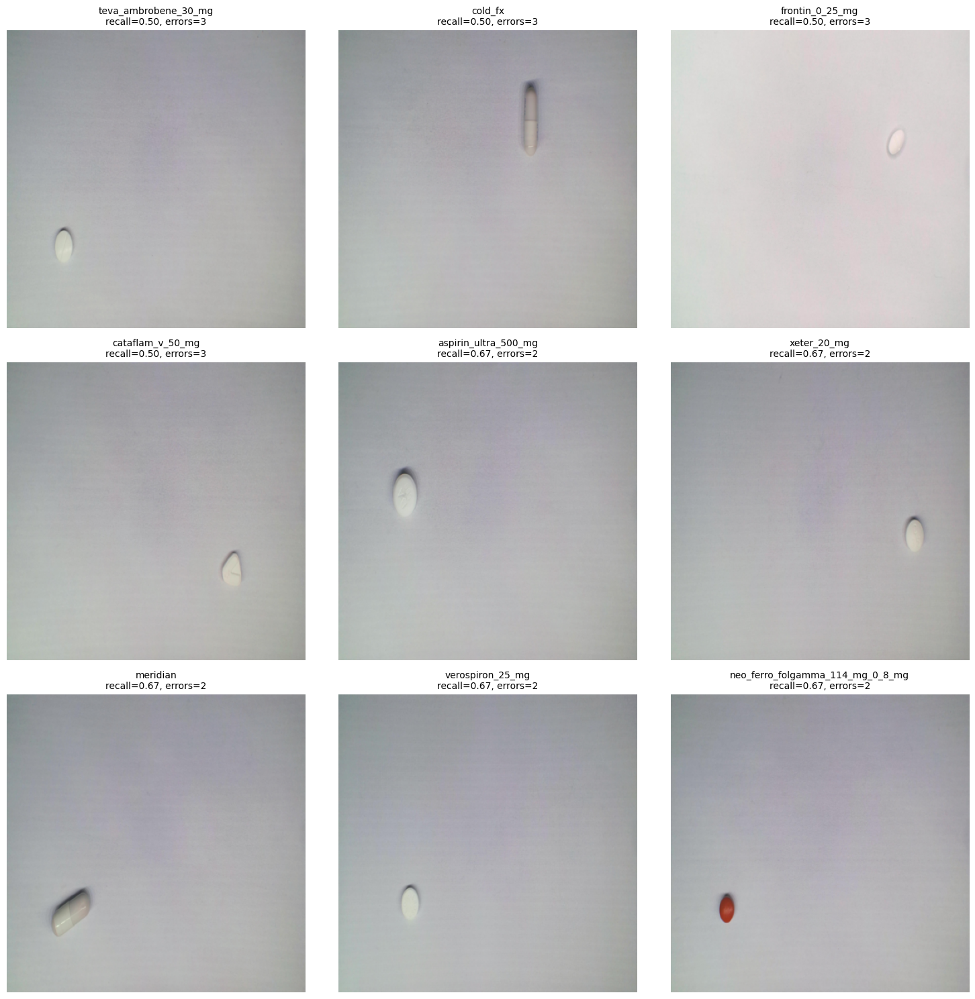

In [31]:
# Худшие классы
class_metrics = {
    'teva_ambrobene_30_mg':       {'recall': 0.50, 'errors': 3},
    'cold_fx':                     {'recall': 0.50, 'errors': 3},
    'frontin_0_25_mg':             {'recall': 0.50, 'errors': 3},
    'cataflam_v_50_mg':            {'recall': 0.50, 'errors': 3},
    'aspirin_ultra_500_mg':        {'recall': 0.67, 'errors': 2},
    'xeter_20_mg':                 {'recall': 0.67, 'errors': 2},
    'meridian':                    {'recall': 0.67, 'errors': 2},
    'verospiron_25_mg':            {'recall': 0.67, 'errors': 2},
    'neo_ferro_folgamma_114_mg_0_8_mg': {'recall': 0.67, 'errors': 2},
}

# Получаем словарь соответствия имя_класса -> индекс
class_to_idx = test_dataset.class_to_idx

# Для каждого класса найдём индекс первого попавшегося изображения
sample_indices = {}
for class_name in class_metrics.keys():
    if class_name not in class_to_idx:
        print(f"Класс '{class_name}' не найден в датасете, пропускаем.")
        continue
    class_idx = class_to_idx[class_name]
    # Ищем все индексы образцов данного класса
    indices = [i for i, t in enumerate(test_dataset.targets) if t == class_idx]
    if indices:
        sample_indices[class_name] = indices[0]  # берём первый
    else:
        print(f"Для класса '{class_name}' нет изображений в тестовой выборке.")

# Функция денормализации изображения (обратная операции Normalize((0.5), (0.5)))
def denormalize(tensor):
    """Преобразует тензор из диапазона [-1,1] в [0,1] для отображения."""
    img = tensor.cpu().numpy().transpose((1, 2, 0))  # (C, H, W) -> (H, W, C)
    img = img * 0.5 + 0.5  # денормализация
    img = np.clip(img, 0, 1)
    return img

# Отображаем изображения в сетке
n_classes = len(sample_indices)
cols = 3  # количество столбцов в сетке
rows = (n_classes + cols - 1) // cols

fig, axes = plt.subplots(rows, cols, figsize=(15, 5 * rows))
axes = axes.flatten() if n_classes > 1 else [axes]

for ax, (class_name, idx) in zip(axes, sample_indices.items()):
    img_tensor, label = test_dataset[idx]  # загружаем образец
    img_disp = denormalize(img_tensor)
    ax.imshow(img_disp)
    metrics = class_metrics[class_name]
    ax.set_title(f"{class_name}\nrecall={metrics['recall']:.2f}, errors={metrics['errors']}", fontsize=10)
    ax.axis('off')

# Скрыть неиспользуемые подграфики
for ax in axes[len(sample_indices):]:
    ax.axis('off')

plt.tight_layout()
plt.show()

**На каких классах модель не совершает ошибок?**
- acc_long_600_mg
- advil_ultra_forte
- algoflex_forte_dolo_400_mg
- algoflex_rapid_400_mg
- algopyrin_500_mg
- apranax_550_mg
- atoris_20_mg
- bila_git
- c_vitamin_teva_500_mg
- calci_kid
- cetirizin_10_mg
- co_xeter_20_mg_10_mg
- coldrex
- concor_10_mg
- concor_5_mg
- condrosulf_800_mg
- controloc_20_mg
- covercard_plus_10_mg_2_5_mg_5_mg
- dorithricin_mentol
- doxazosin_hexal_4_mg
- doxazosin_sandoz_uro_4_mg
- favipiravir_meditop_200_mg
- frontin_0_5_mg
- furon_40_mg
- jutavit_c_vitamin
- ketodex_25_mg
- koleszterin_kontroll
- lactamed
- letrox_50_mikrogramm
- lordestin_5_mg
- magne_b6
- merckformin_xr_1000_mg
- mezym_forte_10_000_egyseg
- milgamma
- milgamma_n
- naprosyn_250_mg
- nebivolol_sandoz_5_mg
- neo_citran
- no_spa_40_mg
- noclaud_50_mg
- nolpaza_20_mg
- normodipine_5_mg
- novo_c_plus
- nurofen_forte_400_mg
- ocutein
- pantoprazol_sandoz_40_mg
- provera_5_mg
- revicet_akut_10_mg
- salazopyrin_en_500_mg
- sedatif_pc
- semicillin_500_mg
- sinupret_forte
- sirdalud_4_mg
- strepfen_8_75_mg
- strepsils
- tricovel_tricoage45
- tritace_hct_5_mg_25_mg
- urotrin
- urzinol
- valeriana_teva
- vita_c
- voltaren_dolo_rapid_25_mg
- zadex_60_mg

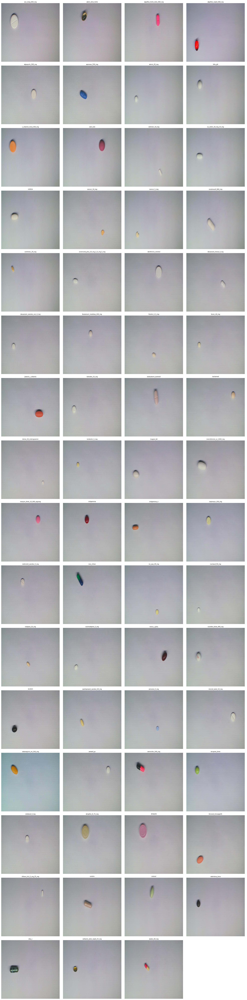

In [34]:
# Лучшие классы
target_classes = [
    "acc_long_600_mg",
    "advil_ultra_forte",
    "algoflex_forte_dolo_400_mg",
    "algoflex_rapid_400_mg",
    "algopyrin_500_mg",
    "apranax_550_mg",
    "atoris_20_mg",
    "bila_git",
    "c_vitamin_teva_500_mg",
    "calci_kid",
    "cetirizin_10_mg",
    "co_xeter_20_mg_10_mg",
    "coldrex",
    "concor_10_mg",
    "concor_5_mg",
    "condrosulf_800_mg",
    "controloc_20_mg",
    "covercard_plus_10_mg_2_5_mg_5_mg",
    "dorithricin_mentol",
    "doxazosin_hexal_4_mg",
    "doxazosin_sandoz_uro_4_mg",
    "favipiravir_meditop_200_mg",
    "frontin_0_5_mg",
    "furon_40_mg",
    "jutavit_c_vitamin",
    "ketodex_25_mg",
    "koleszterin_kontroll",
    "lactamed",
    "letrox_50_mikrogramm",
    "lordestin_5_mg",
    "magne_b6",
    "merckformin_xr_1000_mg",
    "mezym_forte_10_000_egyseg",
    "milgamma",
    "milgamma_n",
    "naprosyn_250_mg",
    "nebivolol_sandoz_5_mg",
    "neo_citran",
    "no_spa_40_mg",
    "noclaud_50_mg",
    "nolpaza_20_mg",
    "normodipine_5_mg",
    "novo_c_plus",
    "nurofen_forte_400_mg",
    "ocutein",
    "pantoprazol_sandoz_40_mg",
    "provera_5_mg",
    "revicet_akut_10_mg",
    "salazopyrin_en_500_mg",
    "sedatif_pc",
    "semicillin_500_mg",
    "sinupret_forte",
    "sirdalud_4_mg",
    "strepfen_8_75_mg",
    "strepsils",
    "tricovel_tricoage45",
    "tritace_hct_5_mg_25_mg",
    "urotrin",
    "urzinol",
    "valeriana_teva",
    "vita_c",
    "voltaren_dolo_rapid_25_mg",
    "zadex_60_mg"
]

# Словарь соответствия имя_класса -> индекс
class_to_idx = test_dataset.class_to_idx

# Для каждого класса найдём индекс первого попавшегося изображения
sample_indices = {}
for class_name in target_classes:
    if class_name not in class_to_idx:
        print(f"Класс '{class_name}' не найден в тестовом датасете, пропускаем.")
        continue
    class_idx = class_to_idx[class_name]
    # Ищем все индексы образцов данного класса
    indices = [i for i, t in enumerate(test_dataset.targets) if t == class_idx]
    if indices:
        sample_indices[class_name] = indices[0]  # берём первый
    else:
        print(f"Для класса '{class_name}' нет изображений в тестовой выборке.")

# Функция денормализации изображения (обратная операции Normalize((0.5), (0.5)))
def denormalize(tensor):
    """Преобразует тензор из диапазона [-1,1] в [0,1] для отображения."""
    img = tensor.cpu().numpy().transpose((1, 2, 0))  # (C, H, W) -> (H, W, C)
    img = img * 0.5 + 0.5  # денормализация
    img = np.clip(img, 0, 1)
    return img

# Отображаем изображения в сетке
n_classes = len(sample_indices)
if n_classes == 0:
    print("Нет доступных классов для отображения.")
else:
    cols = 4  # количество столбцов в сетке
    rows = (n_classes + cols - 1) // cols

    fig, axes = plt.subplots(rows, cols, figsize=(20, 5 * rows))
    axes = axes.flatten() if n_classes > 1 else [axes]

    for ax, (class_name, idx) in zip(axes, sample_indices.items()):
        img_tensor, label = test_dataset[idx]  # загружаем образец
        img_disp = denormalize(img_tensor)
        ax.imshow(img_disp)
        ax.set_title(class_name, fontsize=8)
        ax.axis('off')

    # Скрыть неиспользуемые подграфики
    for ax in axes[len(sample_indices):]:
        ax.axis('off')

    plt.tight_layout()
    plt.show()

- **Почему модель может ошибаться на первой группе классов?**
- **Почему модель распознаёт безошибочно вторые?**

Сложно сказать, признаки недостаточно хорошо извлекаются для первой группы (наиболее ошибочных). Все первые классы таблеток - белые, а также круглые или вытянутые. В группе хорошо классифицируемых такие тоже есть, но в большинстве своём там цветные таблетки, имеющие явные отличия от других.

**Как можно улучшить точность классификатора?**

Можно разморозить больше слоёв модели и провести более долгое обучение. Можно выбрать более сложную модель.

**Как ещё можно проанализировать результаты и ошибки модели?**

Построим Confusion Matrix, чтобы понять с чем модель путает классы, на которых ошибается больше всего

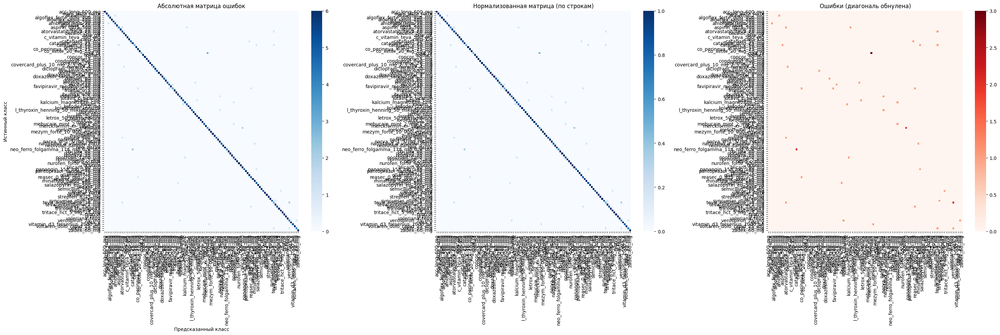

In [50]:
class_names = test_dataset.classes 
cm = confusion_matrix(labels_true, labels_predicted)

# Нормализованная матрица по строкам
cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

# Матрица только ошибок (без диагонали)
cm_errors = cm.copy()
np.fill_diagonal(cm_errors, 0)

# Визуализация
fig, axes = plt.subplots(1, 3, figsize=(30, 10))

# Абсолютные значения
sns.heatmap(cm, annot=False, xticklabels=class_names, yticklabels=class_names,
            cmap='Blues', ax=axes[0])
axes[0].set_title('Абсолютная матрица ошибок')
axes[0].set_xlabel('Предсказанный класс')
axes[0].set_ylabel('Истинный класс')

# Нормализованная
sns.heatmap(cm_norm, annot=False, xticklabels=class_names, yticklabels=class_names,
            cmap='Blues', ax=axes[1])
axes[1].set_title('Нормализованная матрица (по строкам)')

# Только ошибки
sns.heatmap(cm_errors, annot=False, xticklabels=class_names, yticklabels=class_names,
            cmap='Reds', ax=axes[2])
axes[2].set_title('Ошибки (диагональ обнулена)')

plt.tight_layout()
plt.show()

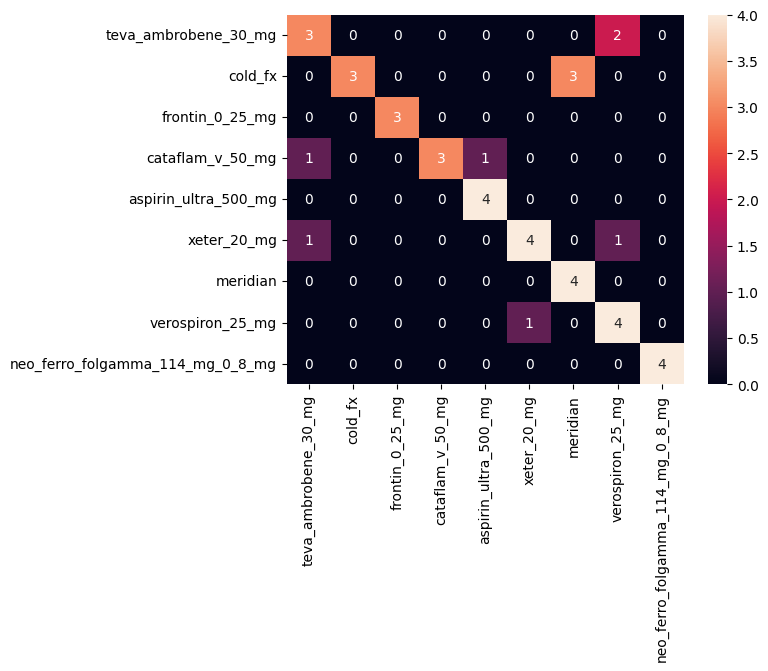

In [49]:
# Вырежем только классы, в которых модель ошибается чаще всего
problematic = ['teva_ambrobene_30_mg', 'cold_fx', 'frontin_0_25_mg', 'cataflam_v_50_mg', 'aspirin_ultra_500_mg', 'xeter_20_mg', 'meridian', 'verospiron_25_mg', 'neo_ferro_folgamma_114_mg_0_8_mg']

# Найдём индексы этих классов
indices = [class_names.index(name) for name in problematic]

# Вырежем часть матрицы
cm_problem = cm[np.ix_(indices, indices)]

# Визуализируем
sns.heatmap(cm_problem, annot=True, fmt='d', xticklabels=problematic, yticklabels=problematic)
plt.show()

**Вывод:** Как видно модель путает визуально очень похожие между собой классы: оба классы вытянутые и белые, либо круглые и белые, без видимых отличий. Необходимо больше обучать модель, повышая её обобщающую способность, либо брать более мощную версию.